In [1]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import scipy.io
import glob,csv

from pykrige.ok import OrdinaryKriging
from mpl_toolkits.basemap import Basemap
%matplotlib inline

In [2]:
data=scipy.io.loadmat('ANHA4_Th_diss.mat')
NEMO_dep=data['NEMO_dep']
Pa_diss=data['Th_diss']
#print Pa_diss.shape
lons=data['lons']
lats=data['lats']
Pa_ini=np.empty([1,50,800,544])

coordinate_name=glob.glob('/ocean/xiaoxiny/research/data/Jasper/ANHA4_IC_T.nc')
coordinate_obj=nc.Dataset(coordinate_name[0])
nav_lon=coordinate_obj.variables['nav_lon'][:]
nav_lat=coordinate_obj.variables['nav_lat'][:]
ANHAdep=coordinate_obj.variables['deptht'][:]
#print ANHAdep
print ANHAdep[43]

3220.82


In [3]:
nav_lon10=nav_lon[::10,::10]
nav_lat10=nav_lat[::10,::10]

In [4]:
masked_name=glob.glob('/ocean/xiaoxiny/research/NEMO-code/NEMOGCM/CONFIG/myANHA/EXP00/ANHA4-EXH001_y2008m01d05_gridT.nc')
masked=nc.Dataset(masked_name[0])
mask=masked.variables['vosaline'][:]

In [5]:
'input boundinglat'
latlim=45
lim=45

In [4]:
what=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
            #layer,distance,variance
whatt=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
x_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
            #layer,x,y
y_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
z_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
def find(layer):
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]
        
        x_ma=np.ma.masked_where(z<= 1e-200,x)
        x_ma=np.ma.masked_where(np.isnan(x_ma),x_ma)
        y_ma=np.ma.masked_where(z<= 1e-200,y)
        y_ma=np.ma.masked_where(np.isnan(y_ma),y_ma)
        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(y_ma),z_ma)        
        #x_ma=x_ma.compressed()
        #y_ma=y_ma.compressed()
        #z_ma=z_ma.compressed()
        
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        xx_lon_ma=np.ma.masked_where(nav_lat<45,xx_lon)
        yy_lat_ma=np.ma.masked_where(nav_lat<45,yy_lat)

        xx_dis=np.ma.masked_where(np.isnan(xx_dis),xx_dis)
        yy_dis=np.ma.masked_where(np.isnan(yy_dis),yy_dis)
        z_ma=np.ma.masked_where(np.isnan(yy_dis),z_ma)
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis.compressed()
        yyy_dis=yy_dis.compressed()
        zzz_ma=z_ma.compressed()
        
#        woww=[np.empty([len(xxx_dis),len(xxx_dis)])]
#        wow=np.empty([len(xxx_dis),len(xxx_dis)])
#        c=np.average(zzz_ma)
#        for k in range (len(xxx_dis)):
#            for j in range (len(xxx_dis)):
#                woww[k,j]=((xxx_dis[k]-xxx_dis[j])**2+(yyy_dis[k]-yyy_dis[j])**2)**0.5
#                wow[k,j]=0.5*c*(zzz_ma[k]-zzz_ma[j])**2
                
#        what[layer,:,:]=wow[:,:]
#        whatt[layer,:,:]=woww[:,:]
        for applen in range(len(xxx_dis)):
            x_all.append(xxx_dis[applen])
            y_all.append(yyy_dis[applen])
            z_all.append(zzz_ma[applen])
        #print z_all

In [5]:
for i in range (43):#no data below layer 43
    find(i)

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Using 'linear' Variogram Model
Slope: -6.58743734582e-22
Nugget: 0.0389649238889 



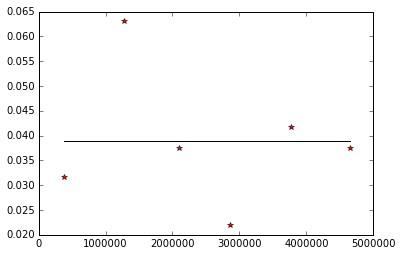

/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:239: RuntimeWarning: invalid value encountered in sqrt
  sigma[n] = np.sqrt(ss_)
/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:243: RuntimeWarning: divide by zero encountered in divide
  epsilon = delta/sigma


Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 

Updating variogram mode...
Using 'linear' Variogram Model
Slope: 1.18940807286e-08
Nugget: 0.0126105288736 



/home/xiaoxiny/anaconda/lib/python2.7/site-packages/pykrige/core.py:257: RuntimeWarning: divide by zero encountered in log
  return Q2 * np.exp(np.sum(np.log(sigma**2))/sigma.shape[0])


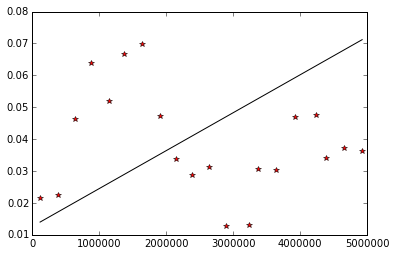

Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 



In [6]:
OK = OrdinaryKriging(x_all,y_all, z_all, variogram_model='linear', verbose=True, enable_plotting=True)
OK.update_variogram_model('linear',variogram_parameters=None,nlags=20,anisotropy_angle=0)

In [6]:
'''Input slope and intercept'''
slope=1.18940807286e-08
inter=0.0126105288736

In [7]:
def write_nc(layer):
        '''a function for  interpolation'''
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]

        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(z_ma),z)
        x_ma=np.ma.masked_where(np.isnan(z_ma),x)
        y_ma=np.ma.masked_where(np.isnan(z_ma),y)

        print ('z_ma %s'%z_ma)
        print ('x_ma %s'%x_ma)
        print ('y_ma %s'%y_ma)
      
        x_ma=x_ma.compressed()
        y_ma=y_ma.compressed()
        z_ma=z_ma.compressed()
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis#.compressed()
        yyy_dis=yy_dis#.compressed()
        zzz_ma=z_ma#.compressed()
        
        print ('zzz_ma %s'%zzz_ma.shape)
        print ('xxx_dis %s'%xxx_dis.shape)
        print ('yyy_dis %s'%yyy_dis.shape)
        
        OK = OrdinaryKriging(xxx_dis,yyy_dis, zzz_ma, variogram_model='linear', verbose=False, enable_plotting=False)
        OK.update_variogram_model('linear',variogram_parameters=[slope,inter],nlags=7,anisotropy_angle=0)
        
        Pa_interp, ss = OK.execute('points',xx_lon, yy_lat)
        Pa_interp=Pa_interp.reshape(800,544)
        Pa_interp=np.ma.masked_where(np.ma.getmask(mask[0,layer,:,:]),Pa_interp)
        #print Pa_interp
        
        fig=plt.figure(figsize=(8, 8)); ax=plt.gca()
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        m.drawcoastlines()
        m.fillcontinents(color = '0.9',alpha=0.95)
        m.drawparallels(np.arange(-80.,81.,10.),labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[0, 0, 0, 1])
        x,y = m(nav_lon, nav_lat)
        x10,y10 = m(nav_lon10, nav_lat10)
        m.plot(x10[-50:,:],y10[-50:,:],x10[-50:,:].T,y10[-50:,:].T,color='k',linewidth=0.1,)
        CS = m.pcolor(x[300:-1,:],y[300:-1,:],Pa_interp[300:-1,:],cmap=plt.cm.YlOrBr)
        CBar = plt.colorbar(CS, shrink=0.8)
        #m.scatter(x[0,90],y[0,90],color='yellow',s=100)
        x_mma=x_ma#.compressed()
        y_mma=y_ma#.compressed()
        for j in range(len(x_mma)):
            x2,y2= m(x_mma[j], y_mma[j])
            cmm = plt.cm.get_cmap('YlOrBr')
            m.scatter(x2,y2,c=zzz_ma[j],vmin=np.min(Pa_interp[300:-1,:]),vmax=np.max(Pa_interp[300:-1,:]),cmap=cmm,s=40)
        #fig.savefig('Part. Pa (Layer:%s).pdf'%layer)
        plt.title('Diss. Th (Layer %s, Depth %.2f m)'%(layer+1,ANHAdep[layer]))
        fig.savefig('/ocean/xiaoxiny/research/writings/Figures/DissTh/Diss. Th (Layer %s).png'%layer,dpi=100)
        Pa_ini[-1,layer,:,:]=Pa_interp
        if layer==43:
            Pa_ini[-1,43:-1,:,:]=Pa_interp
            Pa_ini[-1,-1,:,:]=Pa_interp
            print 'set values of layer 43 for the rest'
        plt.show()

#diss Th interpolation_result

z_ma [ 0.26        0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.056       0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


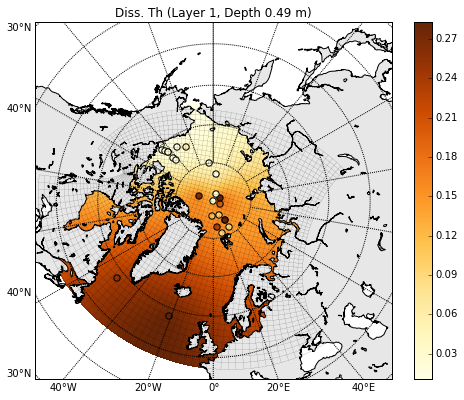

z_ma [ 0.25897157  0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.056       0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


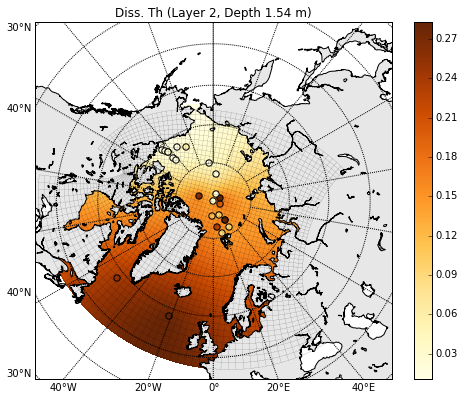

z_ma [ 0.25897157  0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.056       0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


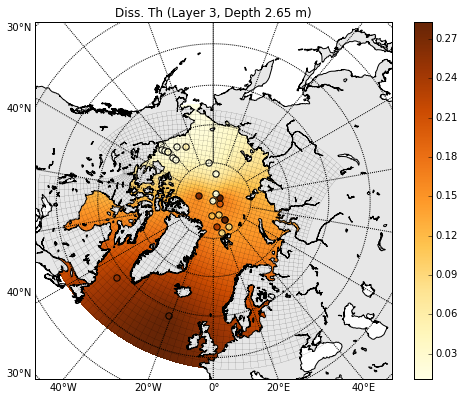

z_ma [ 0.25794314  0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.056       0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


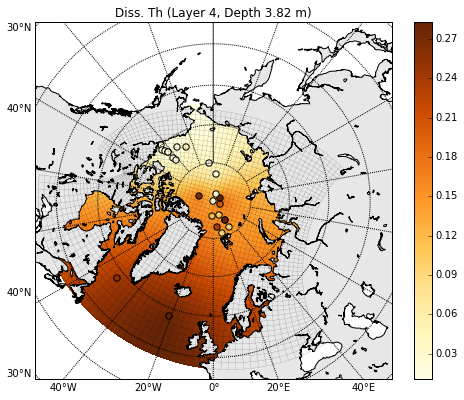

z_ma [ 0.25691471  0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.05778807  0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


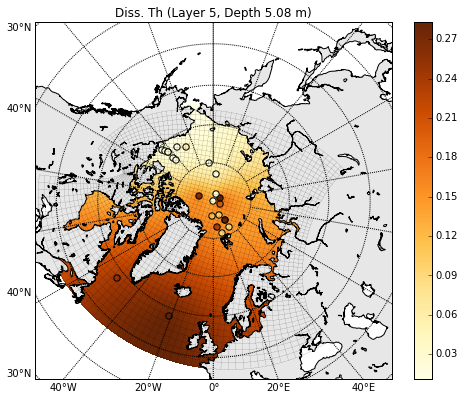

z_ma [ 0.25691471  0.097       0.058       0.092       0.09        0.197       0.392
  0.021       0.118       0.317       0.23        0.05778807  0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


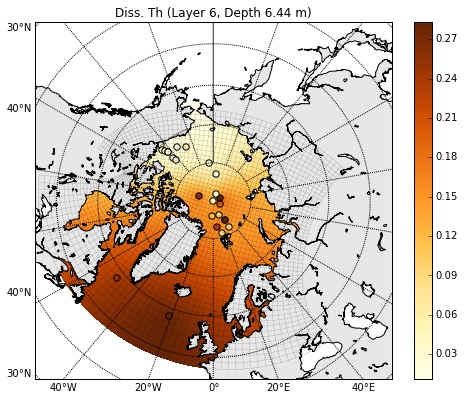

z_ma [ 0.25588628  0.0974441   0.058       0.09091924  0.09017473  0.197       0.392
  0.021       0.118       0.317       0.23        0.06246743  0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


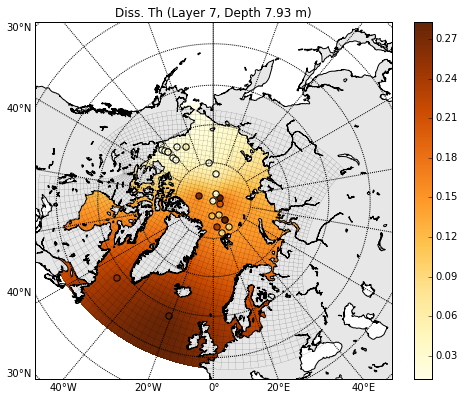

z_ma [ 0.25485785  0.09796138  0.058       0.08966042  0.09037825  0.197       0.392
  0.021       0.118       0.317       0.23        0.06714679  0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


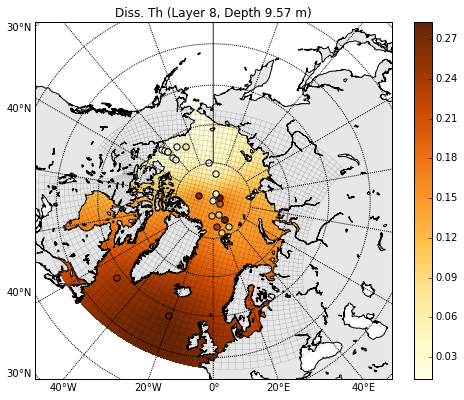

z_ma [ 0.25382942  0.09847866  0.058       0.08840159  0.09058177  0.197       0.392
  0.021       0.118       0.317       0.23        0.07182615  0.302       0.251
  0.013       0.0122      0.0146      0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


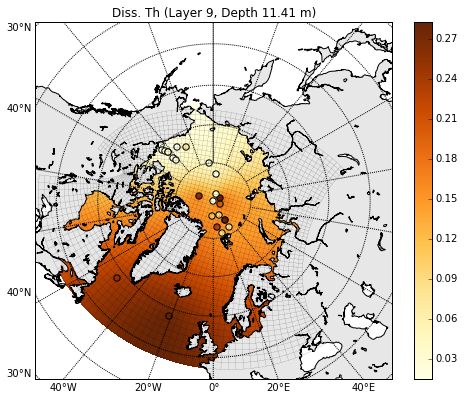

z_ma [ 0.25280099  0.09899593  0.058       0.08714277  0.09078528  0.197       0.392
  0.021       0.118       0.317       0.23        0.07650551  0.302       0.251
  0.013       0.0122      0.01465208  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


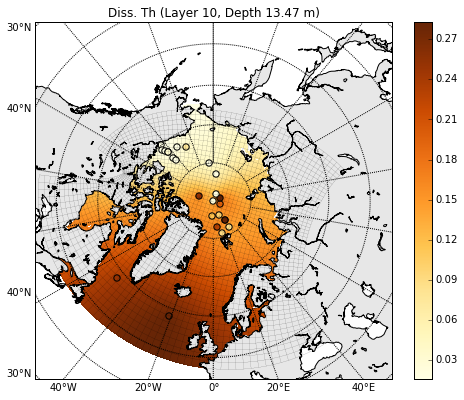

z_ma [ 0.25177256  0.09951321  0.058       0.08588394  0.0909888   0.197       0.392
  0.021       0.118       0.317       0.23        0.08118487  0.302       0.251
  0.013       0.0122      0.01472471  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


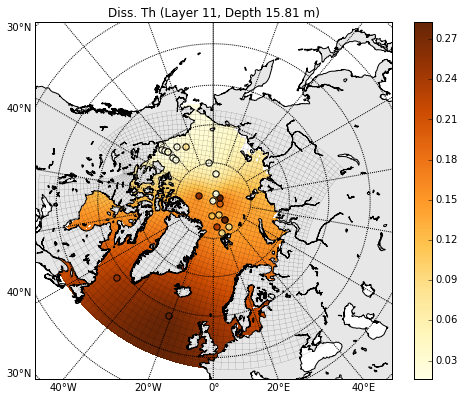

z_ma [ 0.2497157   0.10054776  0.058       0.08336629  0.09139584  0.197       0.392
  0.021       0.118       0.317       0.23        0.09054358  0.302       0.251
  0.013       0.0122      0.01486998  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


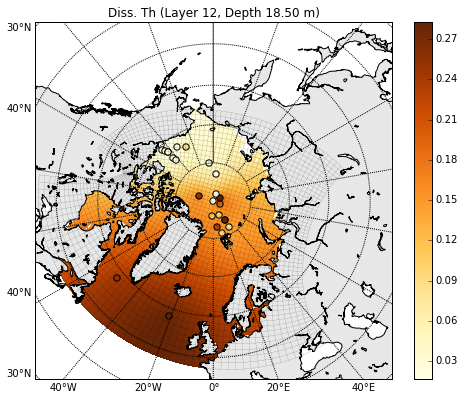

z_ma [ 0.24868727  0.10106504  0.058       0.08210746  0.09159936  0.197       0.392
  0.021       0.118       0.317       0.23        0.09522294  0.302       0.251
  0.013       0.0122      0.01494261  0.0194      0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


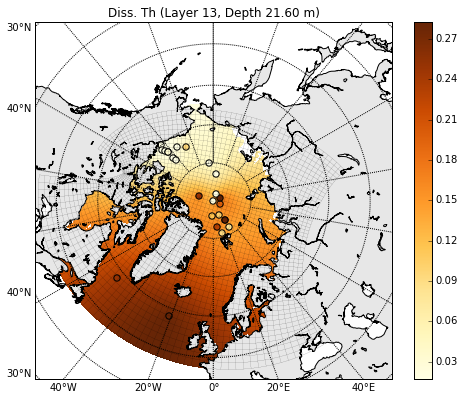

z_ma [ 0.2466304   0.10209959  0.058       0.07958981  0.0920064   0.197       0.392
  0.021       0.118       0.317       0.23        0.10458166  0.302       0.251
  0.013       0.0122      0.01508787  0.01908878  0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


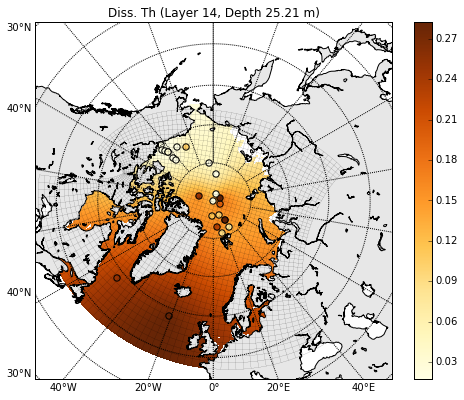

z_ma [ 0.24457354  0.10313414  0.058       0.07707216  0.09241343  0.197       0.392
  0.021       0.118       0.317       0.23        0.08967364  0.302       0.251
  0.013       0.0122      0.01523314  0.0186686   0.0258      0.00325608
  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


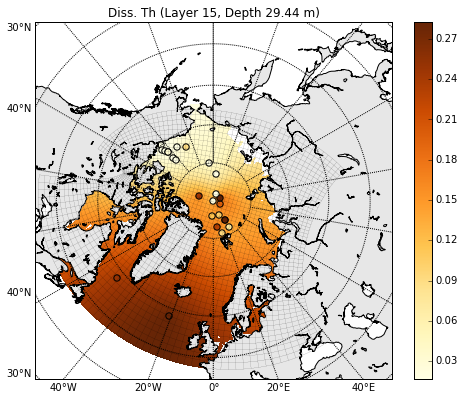

z_ma [ 0.24148825  0.10468597  0.058       0.07329569  0.09302399  0.197       0.392
  0.021       0.118       0.317       0.23        0.06560837  0.302
  0.25494106  0.013       0.0122      0.01545103  0.01849953  0.0258
  0.00325608  0.00551396  0.00922511  0.0329218   0.01286359  0.01584087]
x_ma [-109.     23.     31.     31.     15.     60.    109.    159.     -5.
   30.      9.   -153.    -21.    -51.   -137.   -146.   -173.    174.
    0.   -134.35 -135.3  -136.93 -136.68 -137.   -137.5 ]
y_ma [ 86.    86.    84.    82.    81.    88.    88.    88.    86.    84.    83.
  74.    58.    58.    70.    73.    80.    83.    90.    71.08  71.73
  72.45  72.52  74.5   75.28]
zzz_ma 25
xxx_dis 25
yyy_dis 25


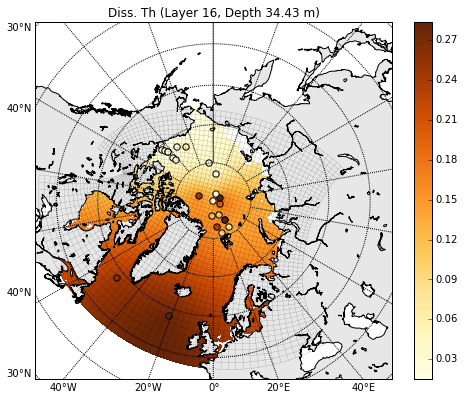

z_ma [0.23840296185717755 0.10623779597064581 0.057999999999999996
 0.06951920980570109 0.0936345426769754 0.19699999999999998 0.392 0.021
 0.11800000000000001 0.317 0.23 0.08471233677013433 0.302
 0.2600979066101461 -- 0.0122 0.015668925631414626 0.0189800916554258
 0.025800000000000003 0.0032560804 0.0055139636 0.0092251064 0.0329217954
 0.0128635892 0.0158408651]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


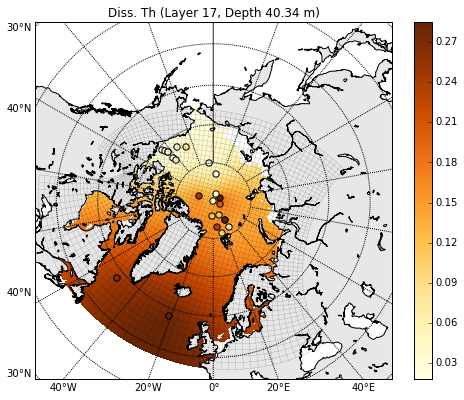

z_ma [0.23428924030616377 0.10830689996505453 0.057999999999999996
 0.06448390777734979 0.09444861637969358 0.19699999999999998 0.392 0.021
 0.11800000000000001 0.317 0.23 0.11718135329777896 0.302 0.266973698345412
 -- 0.0122 0.01595945204276389 0.019620846440791085 0.025800000000000003
 0.0032560804 0.0055139636 0.0092251064 0.0329217954 0.0128635892
 0.0158408651]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


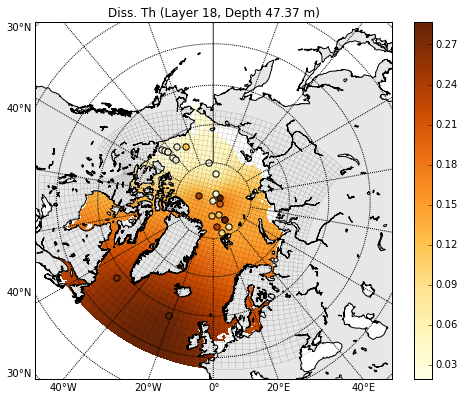

z_ma [0.23017551875514997 0.11037600395946326 0.06010634417645607
 0.06352087115681355 0.09526269008241177 0.19699999999999998 0.392
 0.027621649418802217 0.11965241884230508 0.317 0.23 0.14744340468632774
 0.302 0.27384949008067794 -- 0.0122 0.016249978454113155
 0.02026160122615637 0.025800000000000003 0.0032957237043771542
 0.0054787289401135785 0.009464783252604315 0.0329217954 0.0136755739414846
 0.016870155575518773]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


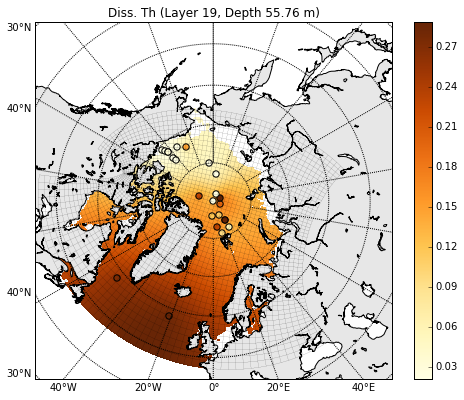

z_ma [0.2250333668163827 0.11296238395247418 0.06383941292161308
 0.06444400986201129 0.0962802822108095 0.19699999999999998 0.392
 0.03935718284349992 0.12258099680362206 0.317 0.23 0.1337554859540854
 0.302 0.28244422974976036 -- 0.0122 0.016613136468299733
 0.020919380330552895 0.025800000000000003 0.0033659834378904564
 0.005416282636684885 0.0098895619651223 0.0329217954 0.01511465255639574
 0.01869436462302201]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


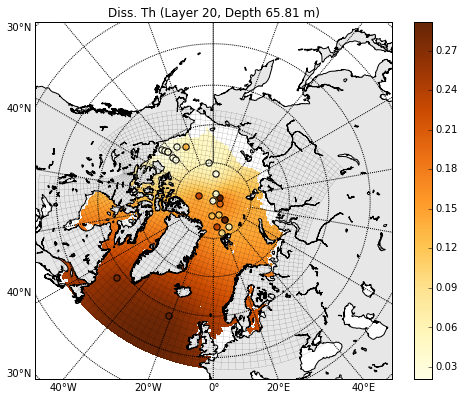

z_ma [0.21783435410210855 0.11658331594268945 0.06906570916483289
 0.06573640404928813 0.09770491119056633 0.19699999999999998 0.392
 0.0557869296380767 0.1266810059494658 0.317 0.23 0.11459239972894611 0.302
 0.2944768652864757 -- 0.0122 0.017121557688160947 0.021053076280960842
 0.025800000000000003 0.00346434706480908 0.005328857811884715
 0.010484252162647478 0.0329217954 0.017129362617271333
 0.021248257289526545]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


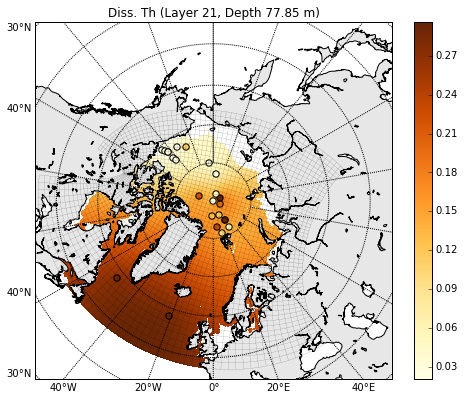

z_ma [0.2106353413878344 0.12020424793290473 0.07429200540805268
 0.06702879823656496 0.09912954017032316 0.19699999999999998 0.392
 0.07221667643265348 0.13078101509530957 0.317 0.23 0.11845717278355607
 0.302 0.30650950082319106 -- 0.013095253773827387 0.021031205948857958
 0.021186772231368788 0.025800000000000003 0.0035627106917277035
 0.005241432987084544 0.011078942360172659 0.0329217954
 0.019144072678146926 0.023802149956031075]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


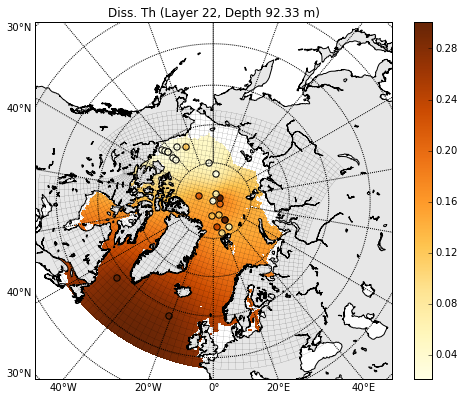

z_ma [0.20137946789805336 0.12485973192032436 0.08101152914933529
 0.0686904479059209 0.10096120600143908 0.19699999999999998 0.392
 0.09334063659710934 0.1360524554256801 0.317 0.23 0.15310058498816514
 0.302 0.31295487565115854 -- 0.01441311385642002 0.02060927987728813
 0.02204771698211342 0.02586169428522267 0.003689178212051648
 0.005129029640912896 0.011843544042705031 0.0329217954
 0.021734414184986974 0.027085726241536903]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


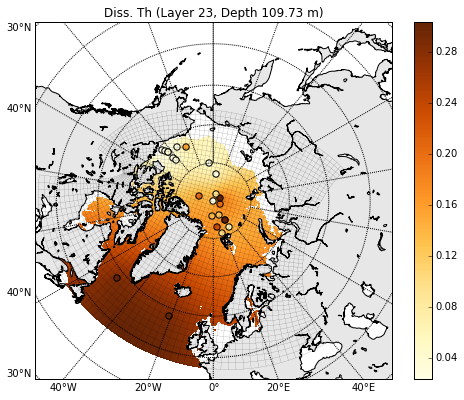

z_ma [0.19006673363276538 0.13054976790494838 0.0892242803886807
 0.07072135305735593 0.1031999086839141 0.19699999999999998 0.392
 0.11915881013144428 0.14249532694057743 0.317 0.23 0.1954425332382429
 0.302 0.31521742250421614 -- 0.014429014049605076 0.023258286596551207
 0.02472538097487766 0.02605045412696449 0.0038437496257809137
 0.00499164777336977 0.0127780572102446 0.0329217954 0.02490038713779148
 0.031098986146044026]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


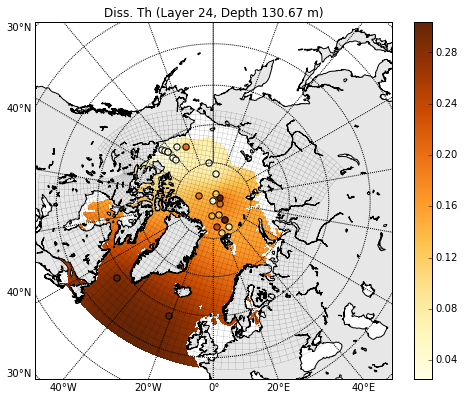

z_ma [0.3116697425927691 0.1399162316657636 0.09967687287512031
 0.0733061414319096 0.10604916664342776 0.19699999999999998 0.392
 0.15201830372059782 0.15069534523226494 0.317 0.23 0.23883510979664355
 0.302 0.3180970275899258 -- 0.014333516942170828 0.026427068944930212
 0.027977837421067443 0.02629069392554499 0.003960249281860881
 0.005003299369031726 0.01396743760529496 0.0329217954 0.028929807259542667
 0.03620677147905309]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


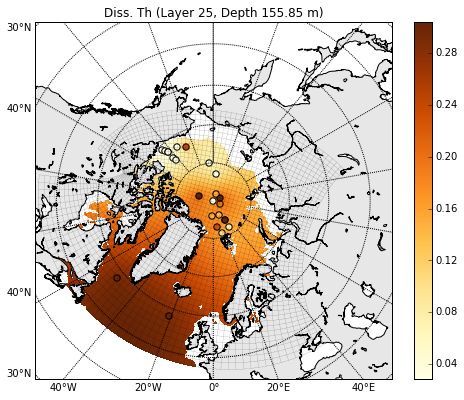

z_ma [0.4426372042168818 0.1568765179460862 0.11087607911059133
 0.07607555754750281 0.10910194302862096 0.19699999999999998 0.392
 0.1872249039946909 0.15948107911621584 0.317 0.23 0.25111330932390413
 0.302 0.32118231875318615 -- 0.014231198612776991 0.027819060680412483
 0.02992597841272612 0.026548093709738377 0.003823581461469579
 0.005623653869464358 0.015241773742848914 0.0329217954 0.03324704310427608
 0.041679398621562794]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -134.35 -135.3 -136.93 -136.68 -137.0
 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 71.08 71.73 72.45 72.52 74.5 75.28]
zzz_ma 24
xxx_dis 24
yyy_dis 24


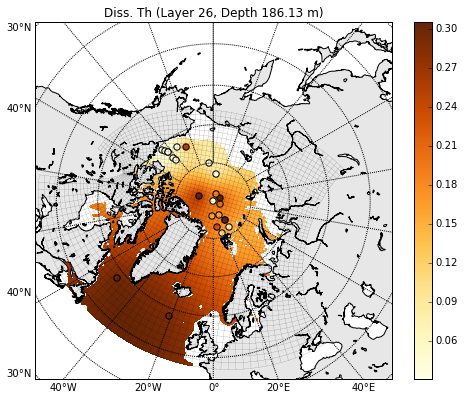

z_ma [0.5229047772678783 0.17949023298651634 0.12580835409121935
 0.07976811236829377 0.1131723115422119 0.19699999999999998 0.392
 0.2341670376934817 0.1711953909614837 0.317 0.23 0.26748424202691823 0.302
 0.32529604030419995 -- 0.014094774173585206 0.029675049661055514
 0.03141197578748274 0.02689129342199623 -- 0.006450793203374536
 0.016940888592920856 0.0329217954 0.039003357563920635
 0.048976234811575745]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


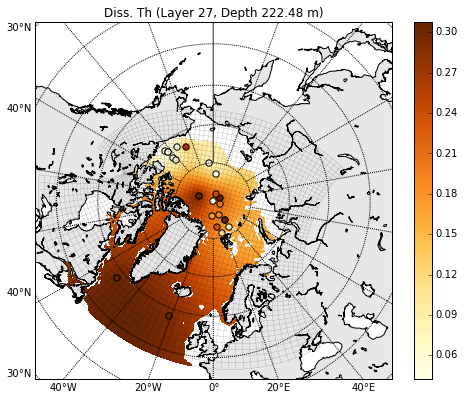

z_ma [0.5460150772669666 0.2043653195309895 0.14223385656991017
 0.08382992267116382 0.11695988143736713 0.19699999999999998 0.392
 0.2858033847621516 0.18408113399127835 0.317 0.23 0.28549226800023375
 0.302 0.32982113401031515 -- 0.014247711338675393 0.031716637539762844
 0.03186960549043498 0.027268813105479867 -- 0.00736064647067573
 0.01880991492799999 0.03696101247883419 0.04240555616669445
 0.052715538486360534]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


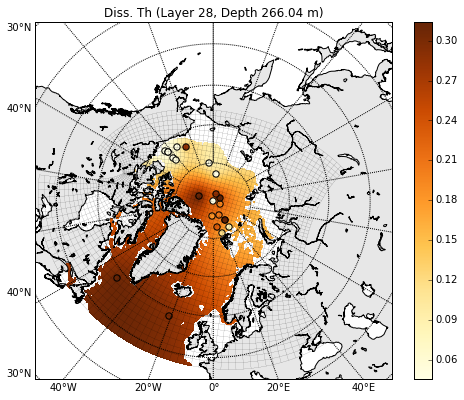

z_ma [0.5754281863567152 0.23317908774693363 0.1595041072962906
 0.08899949942027116 0.12027554100748426 0.19699999999999998 0.392
 0.3515223719404587 0.20048117057465337 0.317 0.23 0.30841157378445344
 0.302 0.33558034418173444 -- 0.015103365421286263 0.03431502211266309
 0.033463361569199275 0.02774929270264086 -- 0.007931872873431191
 0.021003333885888854 0.05091343226929479 0.04034435001226359
 0.048122041437090236]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


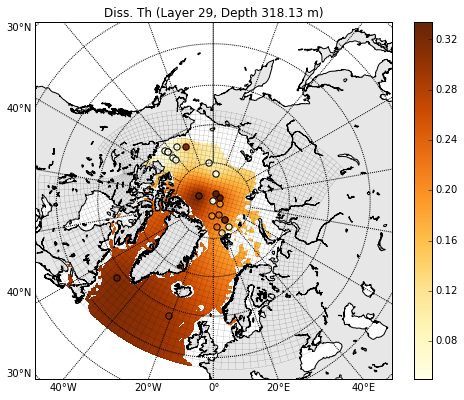

z_ma [0.6090431681735708 0.265405020728382 0.17885818773629839
 0.0994193602717833 0.12406486623047526 0.19699999999999998 0.392
 0.42662978585852396 0.21922406952708196 0.317 0.23 0.334605066109276 0.302
 0.3421622986633565 -- 0.01608125580141297 0.037284604481691935
 0.03855654063235922 0.028298412242253428 -- 0.007363862597681481
 0.023124473171328635 0.06685905488696404 0.037988685835771176
 0.04287233052363846]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


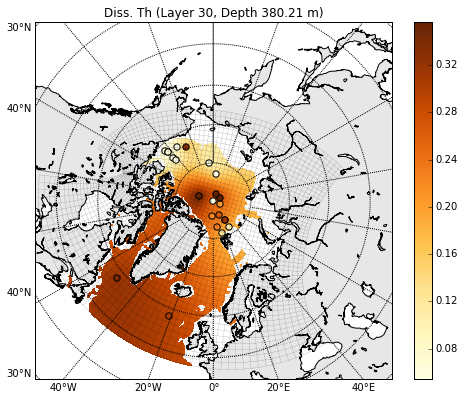

z_ma [0.6945738495622673 0.3046803765495222 0.20244597327255787
 0.11779300374213279 0.12868310634599553 0.19699999999999998 0.392
 0.518166946571166 0.24206697762535428 0.317 0.24646081313508583
 0.3665283848801535 0.302 0.35018405568783345 -- 0.0172730597021924
 0.04090378299394584 0.04476385261558541 0.02896765168115624 --
 0.006770170577422049 0.02570961167545837 0.06693162651728636
 0.03962364273982879 0.04879829411677814]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


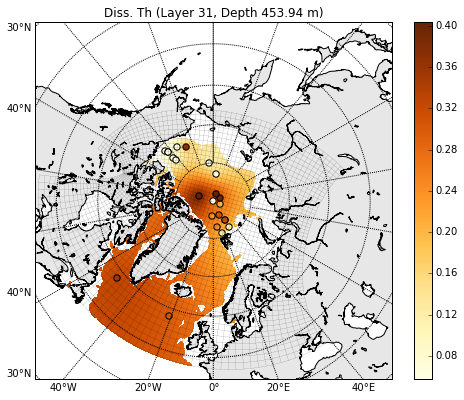

z_ma [0.8120352917063935 0.34999809480468397 0.22966264889131882
 0.13621879191205308 0.13401184494082663 0.21264838884506912 0.392
 0.5829129981771267 0.25921725870029977 0.32587248454904894
 0.27238827780348446 0.3785454924336758 0.302 0.35885707962287006 --
 0.018658346456265042 0.043500000000000004 0.04850920013498966
 0.02973985103373641 -- 0.0078267387706321 0.02869246379560806
 0.05885935703315984 0.0434082790834939 0.06082752573549671]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


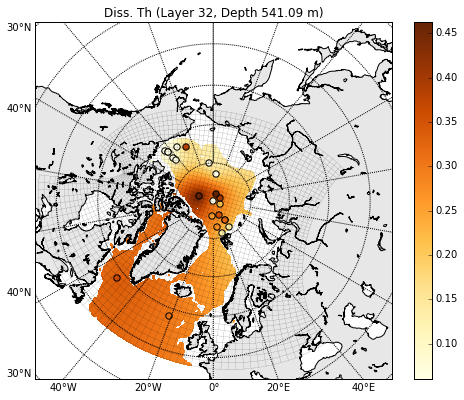

z_ma [0.9529890222793449 0.3614076660704678 0.2556307589918666
 0.15459590800449108 0.14040633125462393 0.25248500721126604 0.392
 0.6056031109035043 0.2674075400320136 0.34845946039939746
 0.30350123540556273 0.35956830724434186 0.302 0.3687740869333498 --
 0.020334320691736112 0.043500000000000004 0.049005050500513646
 0.030666490256832612 -- 0.008336156314132872 0.028986159901607352
 0.05477901018007713 0.04794984269589203 0.07526260367795898]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


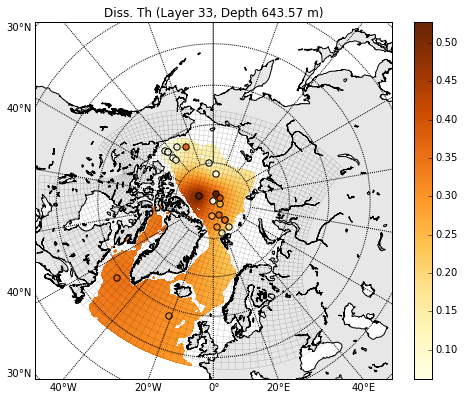

z_ma [1.0389567603263588 0.3696405219640099 0.2828012263328368
 0.1760358767790021 0.14917178893365096 0.29896106197182915 0.392
 0.6320749090842781 0.2769628682523464 0.3748109322248041
 0.33979968594132076 0.3374282578567856 0.302 0.38429220495373456 --
 0.02228962396645236 0.043500000000000004 0.04958354259362496
 0.03174756935044485 -- 0.008780215810368952 0.028940504616982016
 0.05893229026121914 0.053267829629271846 0.08077402104380005]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


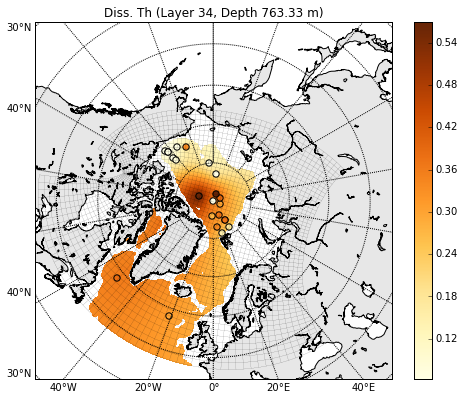

z_ma [1.0582089771851033 0.379049500128058 0.3138531890082312
 0.20053869823558607 0.1705396340186312 0.3520765531267584 0.392
 0.6623283927194482 0.2878832433612981 0.4049269000252689
 0.38128362941075844 0.312125344271007 0.302 0.4068448018454068 --
 0.024507712253259768 0.043500000000000004 0.05024467641432361
 0.03298308831457312 -- 0.010182457933527041 0.027390236299676393
 0.0706711444485072 0.05936515380454078 0.07566844594168405]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


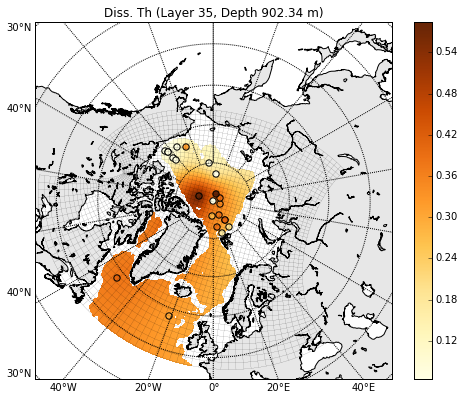

z_ma [1.0806698968536388 0.3900266413194475 0.3500804787961915
 0.22887863396034352 0.19546878661777484 0.4140446261408426 0.392
 0.7132153667084801 0.3006236809884085 0.44006219579247774
 0.41930241299955984 0.2958578350400654 0.302 0.4316698968536387 --
 0.025336627145789048 0.043500000000000004 0.055288715644079646
 0.034424527106056105 -- 0.012518905108634246 0.024935415966041315
 0.08985030756417817 0.062348188191941906 0.07307719646892755]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


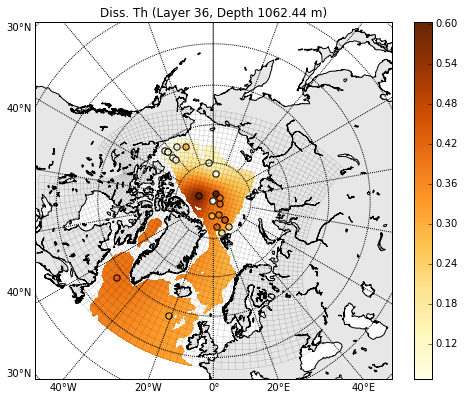

z_ma [1.1060376374590142 0.40257194553817827 0.39148309569671746
 0.2577569592484604 0.22395924673108183 0.48486528101408155
 0.3903060871768454 0.7997155231270412 0.3178338737131127
 0.4802168195264307 0.44388399810439333 0.3013584684282782 0.302
 0.4573395193319648 -- 0.0262839584515368 0.043500000000000004
 0.0610241871130909 0.036071885724893796 -- 0.013992875883251998
 0.021574352200208143 0.11647489017669815 0.058248437474003815
 0.07623352866500137]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


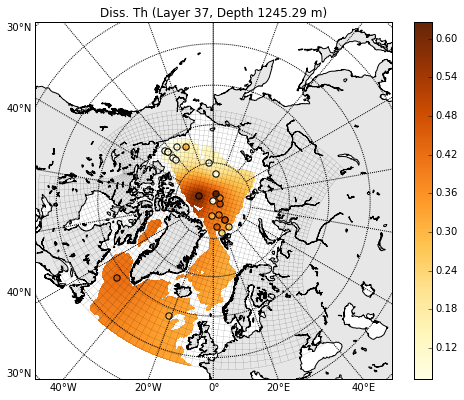

z_ma [1.1335408044000777 0.4166854127842504 0.4380610397098092
 0.28995554191426903 0.2607858961841447 0.4984221983499708
 0.37648574578896093 0.8970281990979223 0.34258672396007 0.5253907712271279
 0.47153828134733095 0.3075466809900175 0.302 0.45235643107598367 --
 0.027349706170503016 0.043500000000000004 0.06728534520600986
 0.0379251641710862 -- 0.010801372844435799 0.01627108608777072
 0.07948384561323649 0.05363031288912835 0.08669953831513738]
x_ma [-109.0 23.0 31.0 31.0 15.0 60.0 109.0 159.0 -5.0 30.0 9.0 -153.0 -21.0
 -51.0 -- -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 81.0 88.0 88.0 88.0 86.0 84.0 83.0 74.0 58.0 58.0 --
 73.0 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 23
xxx_dis 23
yyy_dis 23


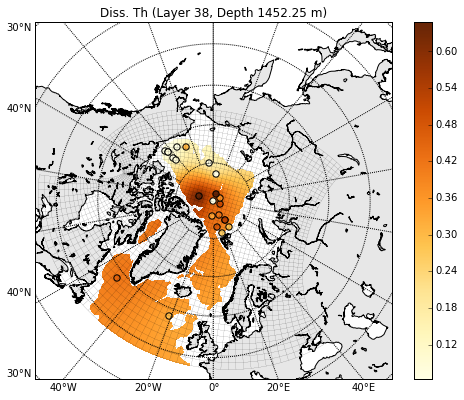

z_ma [1.14 0.4327352592846704 0.46247353518523104 0.28329802928170994 -- -- --
 1.0069554812131771 0.37054827701681814 0.5512577019449192
 0.5027773790847235 0.3368699152461628 0.30264984336516526
 0.4856066828387783 -- 0.03259939667682196 0.043500000000000004
 0.07435813490356648 0.040018682415859104 -- 0.01101243317777762
 0.014691986477350602 0.036935210443827485 0.050785255683829654
 0.08680243402437646]
x_ma [-109.0 23.0 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -173.0 174.0 0.0 -- -135.3 -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0
 80.0 83.0 90.0 -- 71.73 72.45 72.52 74.5 75.28]
zzz_ma 20
xxx_dis 20
yyy_dis 20


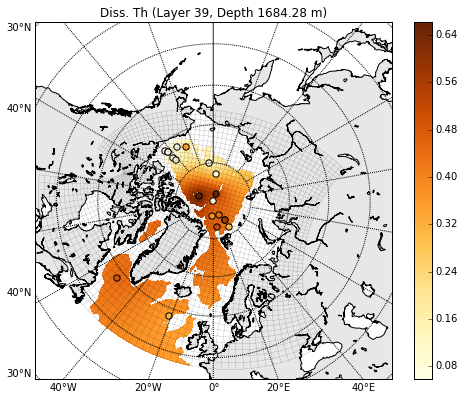

z_ma [1.14 0.450526370399671 0.4812960150605215 0.27593110956535366 -- -- --
 1.1077331466423053 0.40148933982551477 0.5725726563242435
 0.5261288329749239 0.37580408594710607 0.31235126863685464
 0.48385533008724263 -- 0.0359513451477641 0.043500000000000004
 0.0821845825197152 0.042335280473599614 -- -- 0.01943501110193238
 0.041402286292372505 0.051848046563406025 0.0684926609928392]
x_ma [-109.0 23.0 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -173.0 174.0 0.0 -- -- -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0
 80.0 83.0 90.0 -- -- 72.45 72.52 74.5 75.28]
zzz_ma 19
xxx_dis 19
yyy_dis 19


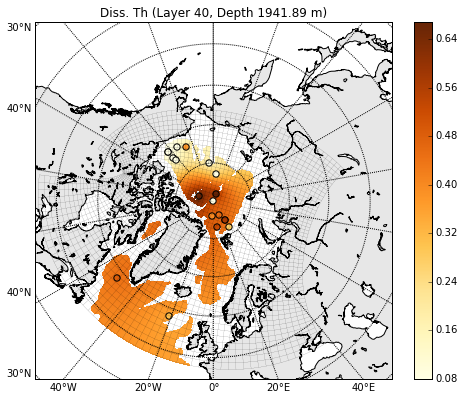

z_ma [1.14 0.47003069962204197 0.501931030034914 0.27 -- -- -- 1.177270320391628
 0.430495908635398 0.5959401618660213 0.466202488117784 0.418487473085918
 0.3545753483555934 0.4662497190137726 -- 0.0414717511882216
 0.043500000000000004 0.08800000000000001 0.04487495834430773 -- --
 0.020587261975733594 0.042400003900000004 0.050519123937333224
 0.09439806101873091]
x_ma [-109.0 23.0 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -173.0 174.0 0.0 -- -- -136.93 -136.68 -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0
 80.0 83.0 90.0 -- -- 72.45 72.52 74.5 75.28]
zzz_ma 19
xxx_dis 19
yyy_dis 19


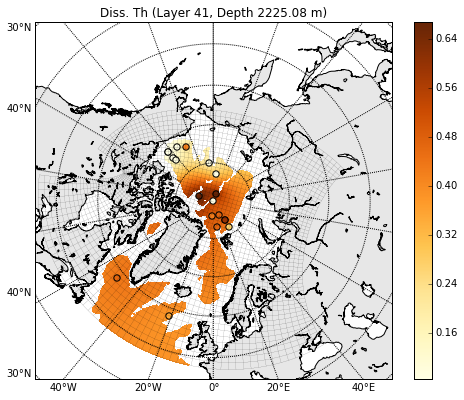

z_ma [1.14 0.48502483872293367 0.5242084229317036 0.27 -- -- --
 1.2529154891324452 0.4338784161807191 0.525658677975992 0.4010123426988683
 0.46 0.3212661202410351 0.4490651665783126 -- 0.050265166578312565
 0.043500000000000004 0.08800000000000001 0.048809036554536826 -- -- -- --
 0.04676024811210849 0.034420529977538555]
x_ma [-109.0 23.0 31.0 31.0 -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -173.0 174.0 0.0 -- -- -- -- -137.0 -137.5]
y_ma [86.0 86.0 84.0 82.0 -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0
 80.0 83.0 90.0 -- -- -- -- 74.5 75.28]
zzz_ma 17
xxx_dis 17
yyy_dis 17


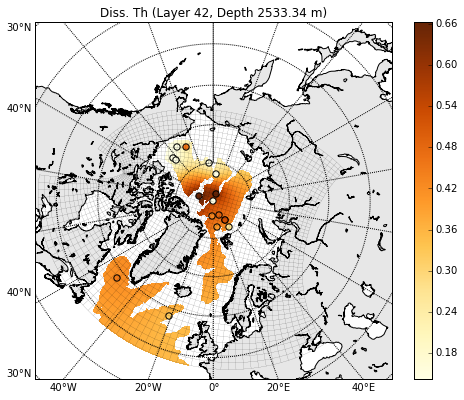

z_ma [1.14 0.44448058679064895 0.5467330073385284 -- -- -- -- 1.3317456611513734
 0.43753404545330216 0.4405822149049683 0.3305583967181769 0.46
 0.2601578099275279 0.44972982644605497 -- 0.05092982644605494 -- -- -- --
 -- -- -- 0.04856500111143495 0.05162900299133321]
x_ma [-109.0 23.0 31.0 -- -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -- -- -- -- -- -- -- -137.0 -137.5]
y_ma [86.0 86.0 84.0 -- -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0 --
 -- -- -- -- -- -- 74.5 75.28]
zzz_ma 13
xxx_dis 13
yyy_dis 13


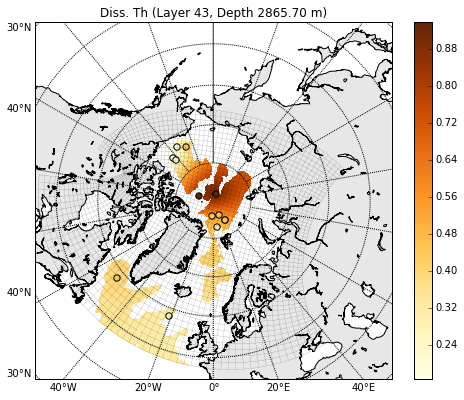

z_ma [1.14 0.4011401795526895 0.570811011359617 -- -- -- -- 1.3495081231341437
 0.4441326720892641 0.4510109923707208 0.3659735570890167 0.46 0.248
 0.39826182126952475 -- 0.052476942283560674 -- -- -- -- -- -- --
 0.050494219834852874 0.058941994937020493]
x_ma [-109.0 23.0 31.0 -- -- -- -- 159.0 -5.0 30.0 9.0 -153.0 -21.0 -51.0 --
 -146.0 -- -- -- -- -- -- -- -137.0 -137.5]
y_ma [86.0 86.0 84.0 -- -- -- -- 88.0 86.0 84.0 83.0 74.0 58.0 58.0 -- 73.0 --
 -- -- -- -- -- -- 74.5 75.28]
zzz_ma 13
xxx_dis 13
yyy_dis 13
set values of layer 43 for the rest


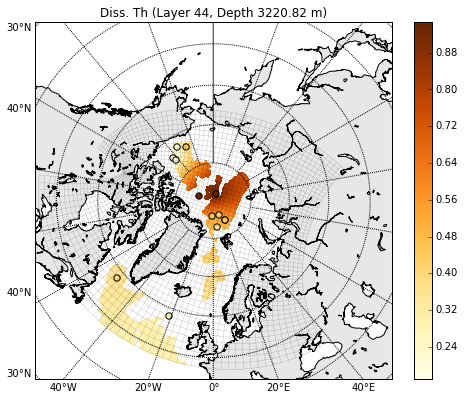

In [8]:
for i in range(44):
    write_nc(i)

#write the nc file

In [18]:
lat = nav_lat
lon = nav_lon
print lat.shape
xmax = lat.shape[1]
ymax = lat.shape[0]
depthtmax = NEMO_dep.shape[0]
print depthtmax

import os
#os.remove("/ocean/xiaoxiny/research/data/data_ANHA_Th_diss.nc")
nemo = nc.Dataset('/ocean/xiaoxiny/research/data/data_ANHA_Th_diss.nc', 'w')
nemo.description = 'Initial diss. Th value' 

# dimensions
nemo.createDimension('x', xmax)
nemo.createDimension('y', ymax)
nemo.createDimension('deptht',depthtmax)
nemo.createDimension('time_counter', None)

# variables
# latitude and longitude
my_lat = nemo.createVariable('nav_lat','float32',('y','x'),zlib=True)
my_lat[:,:] = lat[:,:] 
x = nemo.createVariable('nav_lon','float32',('y','x'),zlib=True)
x[:,:]  = lon[:,:] 
# time
time_counter = nemo.createVariable('time_counter', 'float32', ('time_counter'),zlib=True)
time_counter.units = 'non-dim'
time_counter[0] = 1
# depth
depth = nemo.createVariable('deptht', 'float32', ('deptht'),zlib=True)
depth.units = 'meter'
depth[:] = ANHAdep[:]

Pa = nemo.createVariable('Th_diss', 'float32', ('time_counter','deptht','y','x'), zlib=True)
Pa._units = 'arbitrary'
Pa[:,:,:,:]=Pa_ini[:,:,:,:]
nemo.close()

(800, 544)
50


In [19]:
#test .nc file

In [20]:
import glob,csv
nc_filename=glob.glob('/ocean/xiaoxiny/research/data/data_ANHA_Th_diss.nc')
print("found *.nc file: \n{}".format(nc_filename))

found *.nc file: 
['/ocean/xiaoxiny/research/data/data_ANHA_Th_diss.nc']


In [22]:
ptrc=nc.Dataset(nc_filename[0])
print ptrc.variables
lat=ptrc.variables['nav_lat'][:]
dept=ptrc.variables['deptht'][:]
Pa_diss=ptrc.variables['Th_diss'][:]

OrderedDict([(u'nav_lat', <netCDF4.Variable object at 0x7f94745c7c30>), (u'nav_lon', <netCDF4.Variable object at 0x7f94745c7b98>), (u'time_counter', <netCDF4.Variable object at 0x7f94745c76d8>), (u'deptht', <netCDF4.Variable object at 0x7f94745c7a68>), (u'Th_diss', <netCDF4.Variable object at 0x7f94745c7d60>)])


In [23]:
#test input
Pa_diss[0,0,0,0:10]#-Pa_ini[0,0,0,0:10]

array([ 0.13579024,  0.13643841,  0.1370869 ,  0.13773568,  0.13838476,
        0.13903411,  0.13968371,  0.14033355,  0.14098361,  0.1416339 ], dtype=float32)

In [24]:
dept-ANHAdep

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

In [25]:
lat

array([[-20.07611084, -20.07611084, -20.07611084, ..., -20.07611084,
        -20.07611084, -20.07611084],
       [-19.8411274 , -19.8411274 , -19.8411274 , ..., -19.8411274 ,
        -19.8411274 , -19.8411274 ],
       [-19.605793  , -19.605793  , -19.605793  , ..., -19.605793  ,
        -19.605793  , -19.605793  ],
       ..., 
       [ 56.78784561,  56.80397415,  56.82052612, ...,  54.60116577,
         54.53417206,  54.46720886],
       [ 56.71054459,  56.72655106,  56.74296951, ...,  54.52142715,
         54.45484543,  54.38829041],
       [ 56.63286972,  56.64875031,  56.66504288, ...,  54.44150543,
         54.37533569,  54.30919266]], dtype=float32)